In [1]:
%load_ext pretty_jupyter

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

## Helper functions

In [3]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [4]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [5]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [6]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [7]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [8]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [9]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [10]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [11]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [12]:
def marker_frac_df(adata, markers, clusters = 'louvain_2'):
    gene_cl_frac = sc.pl.dotplot(
        adata, 
        groupby = clusters,
        var_names = markers,
        return_fig = True
    ).dot_size_df
    return gene_cl_frac

def select_clusters_below_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] < cutoff].tolist()

    return select_cl

In [13]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Markers for dotplots

In [14]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [15]:
class_markers = [
    'CD4',
    'CD8A',
    'CD27',
    'GZMB',
    'GZMK',
    'IFI44L',
    'KLRF1',
    'SOX4'
]

## Read previous, non-tracked labels
We ran a preliminary analysis of our dataset that wasn't tracked for reproducibility. Here, we'll retrieve the labels for visualization and comparison to check for consistency.

In [16]:
original_uuid = '3868592c-0087-4ed8-98b2-4bf1b8676111'
original_df = read_parquet_uuid(original_uuid)
original_df = original_df[['barcodes', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3']]
original_df = original_df.rename({'AIFI_L1': 'original_L1', 'AIFI_L2': 'original_L2', 'AIFI_L3': 'original_L3'}, axis = 1)

In [17]:
original_df.head()

,barcodes,original_L1,original_L2,original_L3
0,05ea9806794211eb93b836d1cb6129eb,DC,cDC1,cDC1
1,e225c914794011eb9282e2ceeb91ba52,DC,cDC1,cDC1
2,b1379eae795411eb958b0245821e6993,DC,cDC1,cDC1
3,b13d3a8a795411eb958b0245821e6993,DC,cDC1,cDC1
4,b1430d16795411eb958b0245821e6993,DC,cDC1,cDC1


## Read cell type hierarchy

In [18]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [19]:
search_id = 'tantalum-silicon-mendelevium'

Retrieve files stored in our HISE project store

In [20]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [21]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [22]:
search_df['AIFI_L3'].tolist()

['CD8aa',
 'CM CD8 T cell',
 'Core naive CD8 T cell',
 'GZMK- CD27+ EM CD8 T cell',
 'GZMK+ CD27+ EM CD8 T cell',
 'ISG+ memory CD8 T cell',
 'ISG+ naive CD8 T cell',
 'KLRF1- GZMB+ CD27- EM CD8 T cell',
 'KLRF1+ GZMB+ CD27- EM CD8 T cell',
 'SOX4+ naive CD8 T cell']

## Review CD8aa

In [23]:
cell_type = 'CD8aa'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [24]:
type_uuid

'87cfaf24-6a9d-4627-94c7-dc9869cedb70'

In [25]:
adata = read_adata_uuid(type_uuid)

### Clustering

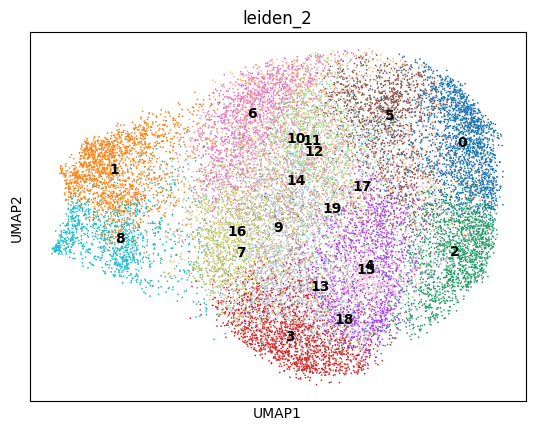

In [26]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

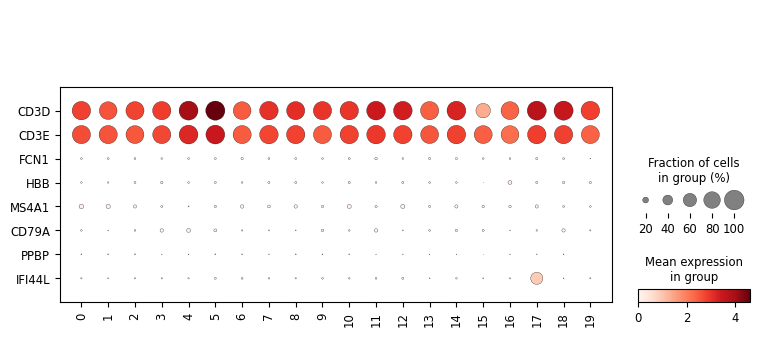

In [27]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

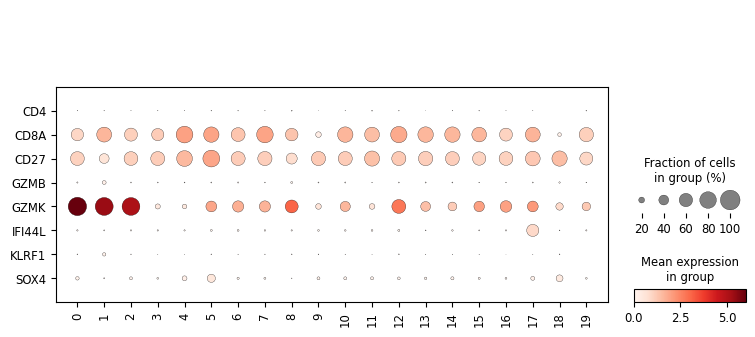

In [28]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [29]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1908
1     1650
2     1637
3     1529
4     1366
5     1234
6     1181
7     1154
8     1099
9     1086
10     928
11     889
12     868
13     819
14     804
15     606
16     553
17     367
18     202
19      76
Name: count, dtype: int64

### Outlier investigation

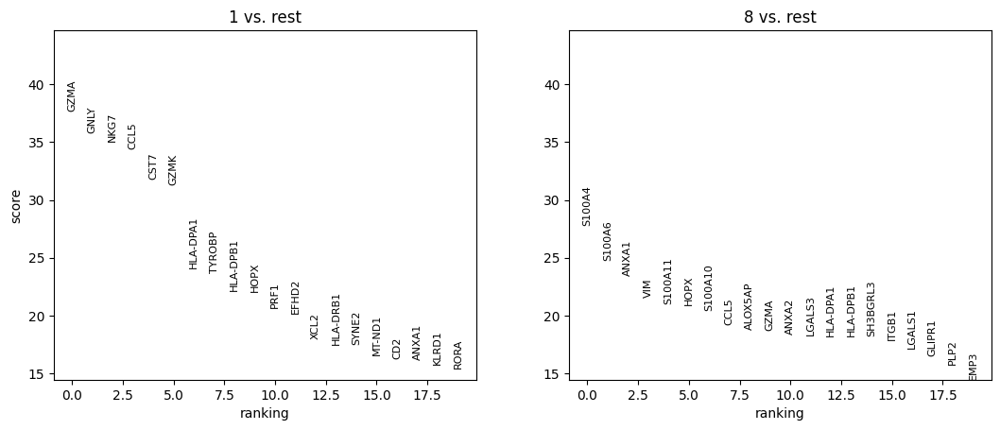

In [30]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1','8']
)
sc.pl.rank_genes_groups(adata)

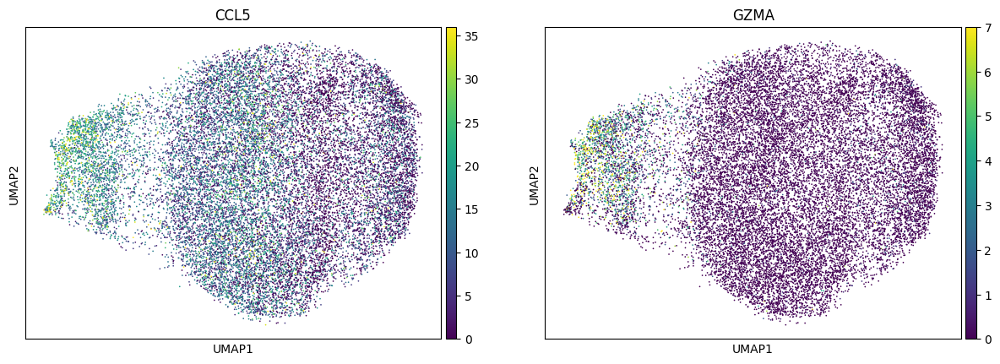

In [31]:
sc.pl.umap(adata, color = ['CCL5','GZMA'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [32]:
adata = add_labels(adata, original_df)

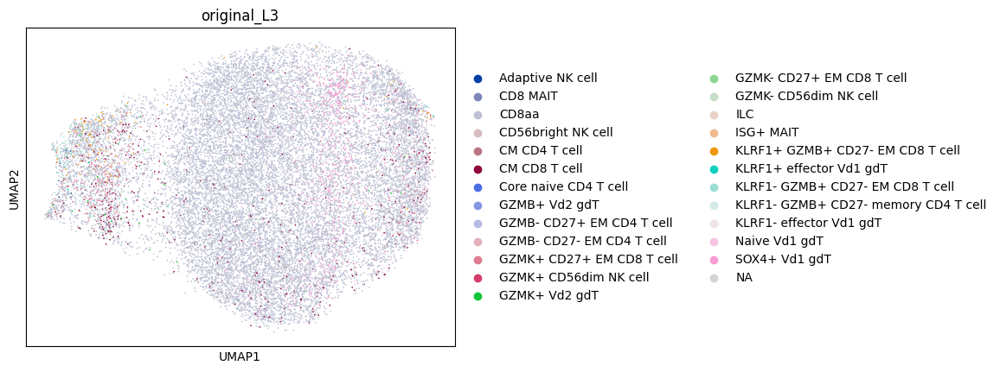

In [33]:
sc.pl.umap(adata, color = 'original_L3')

In [34]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD8aa                                   17567
SOX4+ Vd1 gdT                             638
CM CD8 T cell                             486
GZMK+ CD27+ EM CD8 T cell                 352
Naive Vd1 gdT                             301
KLRF1- GZMB+ CD27- EM CD8 T cell          176
NaN                                       133
KLRF1+ GZMB+ CD27- EM CD8 T cell          111
KLRF1- effector Vd1 gdT                    44
GZMK+ Vd2 gdT                              38
GZMK- CD27+ EM CD8 T cell                  27
CD56bright NK cell                         17
GZMB- CD27+ EM CD4 T cell                  14
GZMB+ Vd2 gdT                              12
KLRF1+ effector Vd1 gdT                     9
Adaptive NK cell                            7
GZMK+ CD56dim NK cell                       4
ILC                                         4
KLRF1- GZMB+ CD27- memory CD4 T cell        4
GZMB- CD27- EM CD4 T cell                   3
CD8 MAIT                                    3
CM CD4 T cell         

In [35]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD8aa                                   0.880287
SOX4+ Vd1 gdT                           0.031970
CM CD8 T cell                           0.024354
GZMK+ CD27+ EM CD8 T cell               0.017639
Naive Vd1 gdT                           0.015083
KLRF1- GZMB+ CD27- EM CD8 T cell        0.008819
NaN                                     0.006665
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.005562
KLRF1- effector Vd1 gdT                 0.002205
GZMK+ Vd2 gdT                           0.001904
GZMK- CD27+ EM CD8 T cell               0.001353
CD56bright NK cell                      0.000852
GZMB- CD27+ EM CD4 T cell               0.000702
GZMB+ Vd2 gdT                           0.000601
KLRF1+ effector Vd1 gdT                 0.000451
Adaptive NK cell                        0.000351
GZMK+ CD56dim NK cell                   0.000200
ILC                                     0.000200
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000200
GZMB- CD27- EM CD4 T cell               0.000150
CD8 MAIT

### Proposed updates

No proposed changes

## Review CM CD8 T cell

In [36]:
cell_type = 'CM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [37]:
type_uuid

'4ec77a6c-9f3e-4b84-ac6b-74b7bd067bfe'

In [38]:
adata = read_adata_uuid(type_uuid)

### Clustering

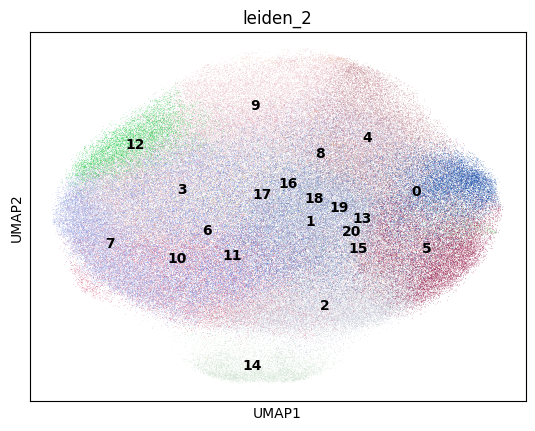

In [39]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

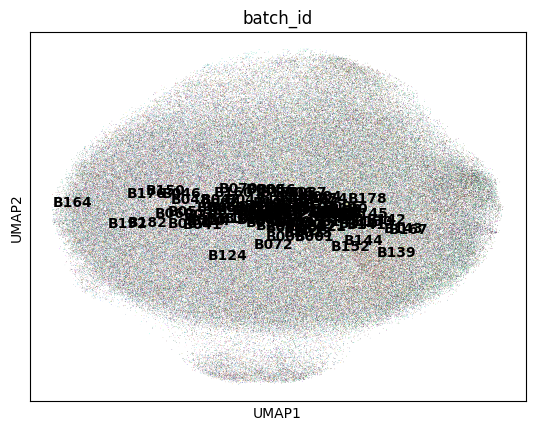

In [40]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

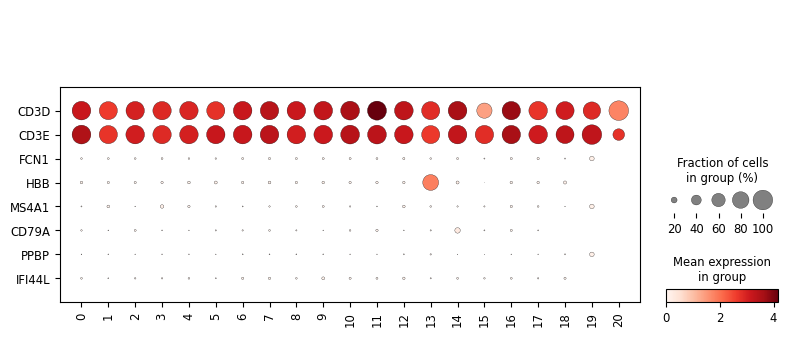

In [41]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

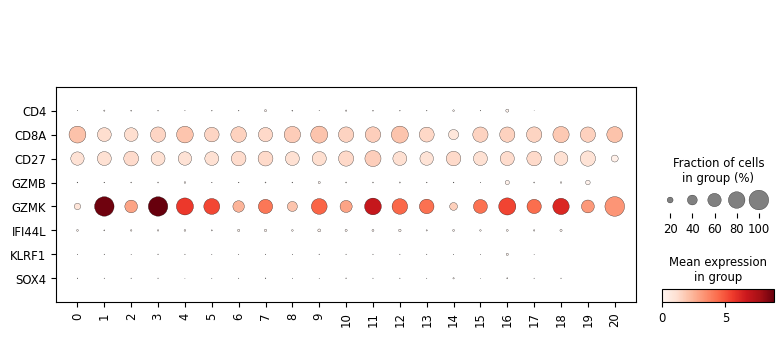

In [42]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

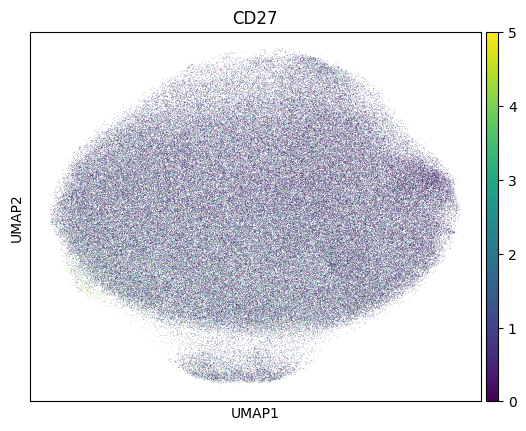

In [43]:
sc.pl.umap(adata, color = ['CD27'], vmax = 'p99', ncols = 2)

### Cluster counts

In [44]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     18781
1     18654
2     18570
3     18416
4     17594
5     16515
6     15854
7     15402
8     13730
9     13721
10    13285
11    12221
12     7221
13     6437
14     6092
15     5360
16     2675
17      733
18       93
19        7
20        4
Name: count, dtype: int64

### Outlier investigation

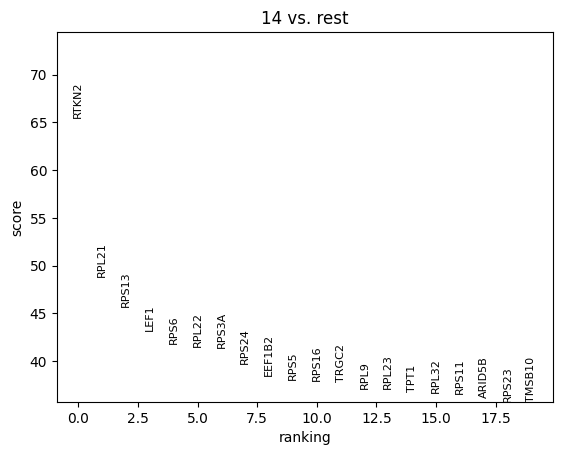

In [45]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['14']
)
sc.pl.rank_genes_groups(adata)

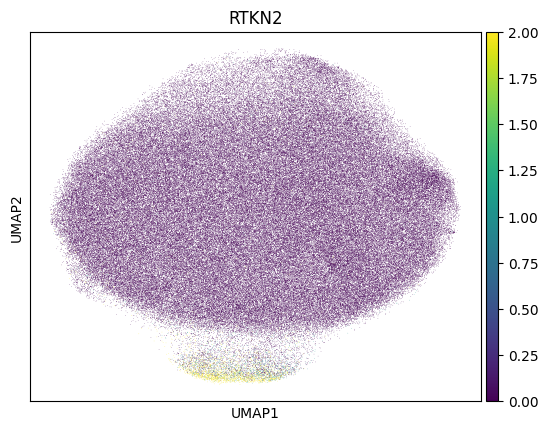

In [46]:
sc.pl.umap(adata, color = ['RTKN2'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [47]:
adata = add_labels(adata, original_df)

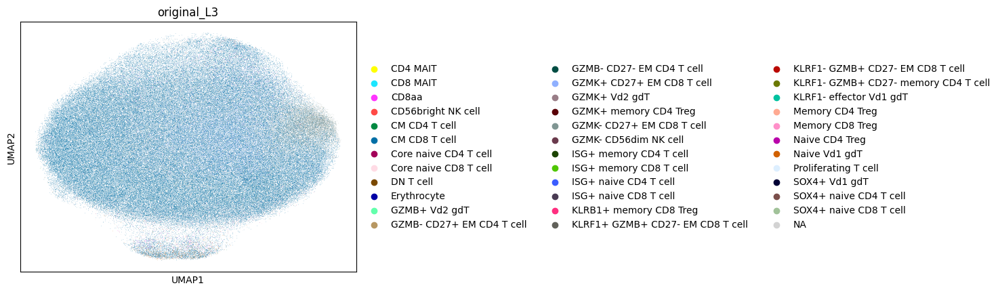

In [48]:
sc.pl.umap(adata, color = 'original_L3')

In [49]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CM CD8 T cell                           170128
GZMK- CD27+ EM CD8 T cell                17868
GZMK+ CD27+ EM CD8 T cell                15560
NaN                                       8439
Core naive CD8 T cell                     4499
GZMB- CD27+ EM CD4 T cell                 1806
Naive Vd1 gdT                              866
CD8aa                                      805
CM CD4 T cell                              499
Core naive CD4 T cell                      236
CD8 MAIT                                   151
GZMK+ Vd2 gdT                               86
KLRF1- GZMB+ CD27- EM CD8 T cell            83
DN T cell                                   79
ISG+ memory CD8 T cell                      63
Naive CD4 Treg                              51
Memory CD8 Treg                             37
GZMB- CD27- EM CD4 T cell                   20
SOX4+ naive CD8 T cell                      17
SOX4+ Vd1 gdT                               16
ISG+ naive CD8 T cell                       12
G

In [50]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CM CD8 T cell                           0.768541
GZMK- CD27+ EM CD8 T cell               0.080717
GZMK+ CD27+ EM CD8 T cell               0.070291
NaN                                     0.038123
Core naive CD8 T cell                   0.020324
GZMB- CD27+ EM CD4 T cell               0.008158
Naive Vd1 gdT                           0.003912
CD8aa                                   0.003637
CM CD4 T cell                           0.002254
Core naive CD4 T cell                   0.001066
CD8 MAIT                                0.000682
GZMK+ Vd2 gdT                           0.000388
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000375
DN T cell                               0.000357
ISG+ memory CD8 T cell                  0.000285
Naive CD4 Treg                          0.000230
Memory CD8 Treg                         0.000167
GZMB- CD27- EM CD4 T cell               0.000090
SOX4+ naive CD8 T cell                  0.000077
SOX4+ Vd1 gdT                           0.000072
ISG+ nai

### Proposed updates

No proposed changes

## Review Core naive CD8 T cell

In [51]:
cell_type = 'Core naive CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [52]:
type_uuid

'ad480bbd-97dc-4447-b924-57e72310b395'

In [53]:
adata = read_adata_uuid(type_uuid)

### Clustering

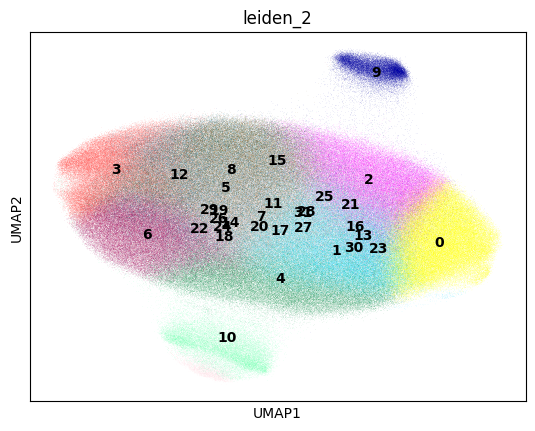

In [54]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

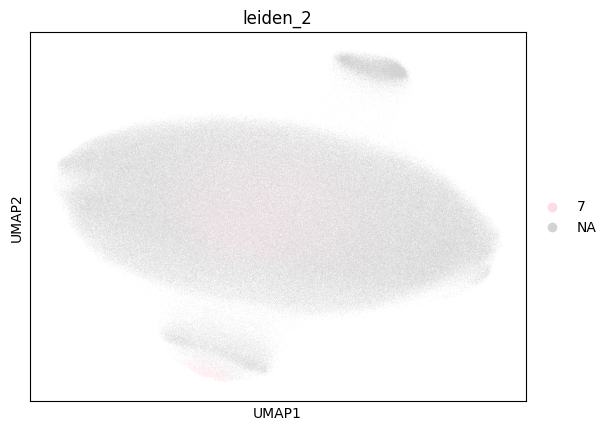

In [55]:
sc.pl.umap(adata, color = 'leiden_2', groups = '7')

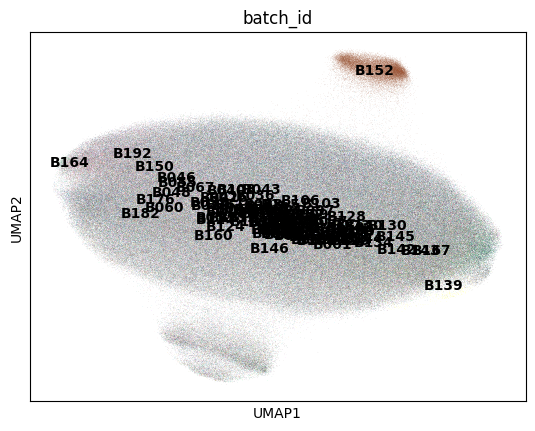

In [56]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

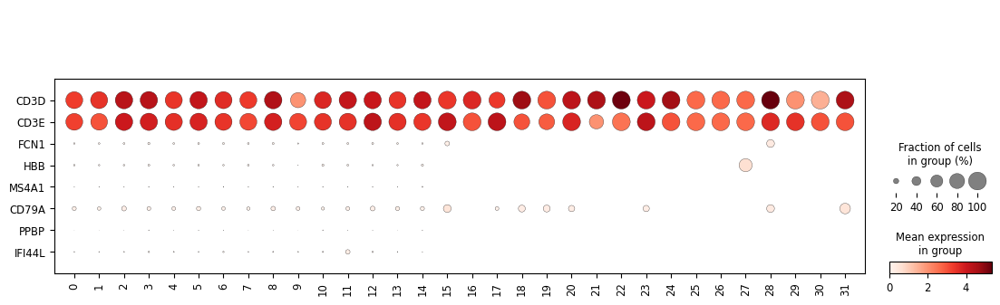

In [57]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

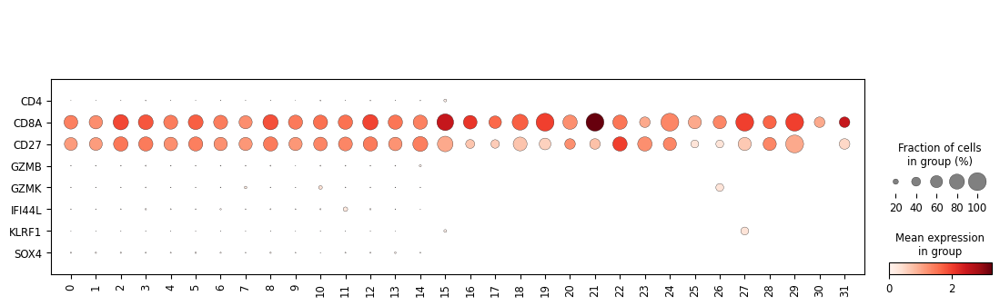

In [58]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

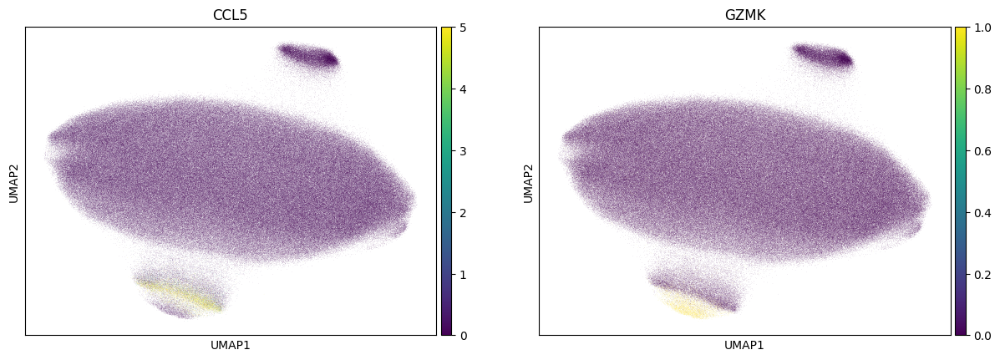

In [59]:
sc.pl.umap(adata, color = ['CCL5','GZMK'], vmax = 'p99')

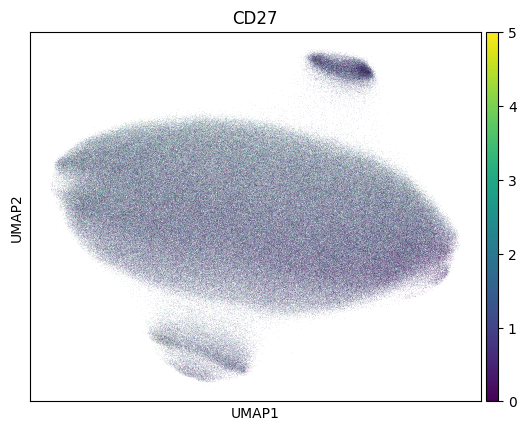

In [60]:
sc.pl.umap(adata, color = ['CD27'], vmax = 'p99')

### Cluster counts

In [61]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     94910
1     77517
2     74413
3     69432
4     67293
5     66597
6     61401
7     59049
8     56234
9     34858
10    33066
11    27715
12    25789
13     4024
14      138
15       12
16       10
17        8
18        7
19        7
20        4
21        4
22        4
23        4
24        3
25        3
26        3
27        3
28        3
29        2
30        2
31        2
Name: count, dtype: int64

### Comparison to original labels

In [62]:
adata = add_labels(adata, original_df)

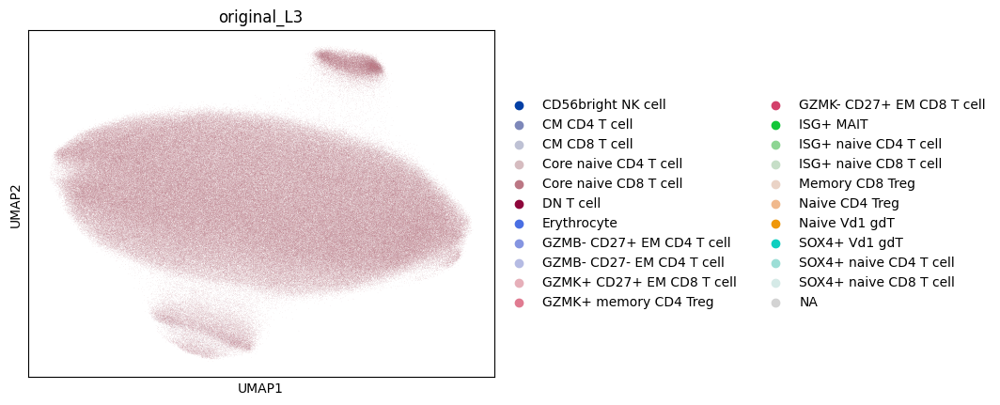

In [63]:
sc.pl.umap(adata, color = 'original_L3')

In [64]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Core naive CD8 T cell        733602
SOX4+ naive CD8 T cell         8398
NaN                            6722
CM CD8 T cell                  1998
Core naive CD4 T cell          1133
ISG+ naive CD8 T cell           203
GZMK- CD27+ EM CD8 T cell       139
Naive Vd1 gdT                    74
SOX4+ naive CD4 T cell           69
DN T cell                        69
Naive CD4 Treg                   32
CM CD4 T cell                    27
Memory CD8 Treg                  20
ISG+ naive CD4 T cell             8
GZMB- CD27- EM CD4 T cell         6
SOX4+ Vd1 gdT                     6
GZMK+ CD27+ EM CD8 T cell         4
Erythrocyte                       3
GZMB- CD27+ EM CD4 T cell         1
GZMK+ memory CD4 Treg             1
ISG+ MAIT                         1
CD56bright NK cell                1
Name: count, dtype: int64

In [65]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Core naive CD8 T cell        0.974864
SOX4+ naive CD8 T cell       0.011160
NaN                          0.008933
CM CD8 T cell                0.002655
Core naive CD4 T cell        0.001506
ISG+ naive CD8 T cell        0.000270
GZMK- CD27+ EM CD8 T cell    0.000185
Naive Vd1 gdT                0.000098
SOX4+ naive CD4 T cell       0.000092
DN T cell                    0.000092
Naive CD4 Treg               0.000043
CM CD4 T cell                0.000036
Memory CD8 Treg              0.000027
ISG+ naive CD4 T cell        0.000011
GZMB- CD27- EM CD4 T cell    0.000008
SOX4+ Vd1 gdT                0.000008
GZMK+ CD27+ EM CD8 T cell    0.000005
Erythrocyte                  0.000004
GZMB- CD27+ EM CD4 T cell    0.000001
GZMK+ memory CD4 Treg        0.000001
ISG+ MAIT                    0.000001
CD56bright NK cell           0.000001
Name: count, dtype: float64

### Proposed updates

- Reassign GZMK+ cells to GZMK+ CD27+ EM CD8 T cell?
- Reassign high CCL5 cells as new Naive CD4 CTL?

## Review GZMK- CD27+ EM CD8 T cell

In [66]:
cell_type = 'GZMK- CD27+ EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [67]:
type_uuid

'bdb7cc5d-0812-43e2-a250-962224f3e2d6'

In [68]:
adata = read_adata_uuid(type_uuid)

### Clustering

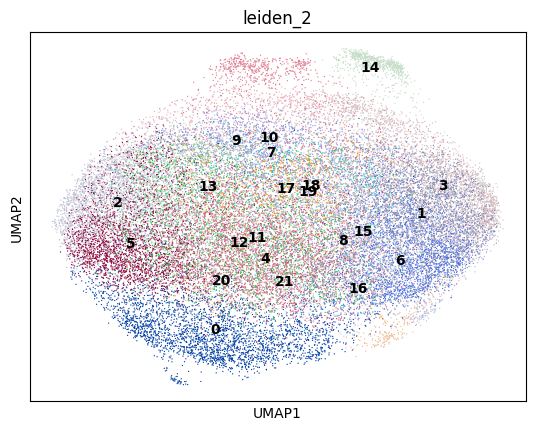

In [69]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

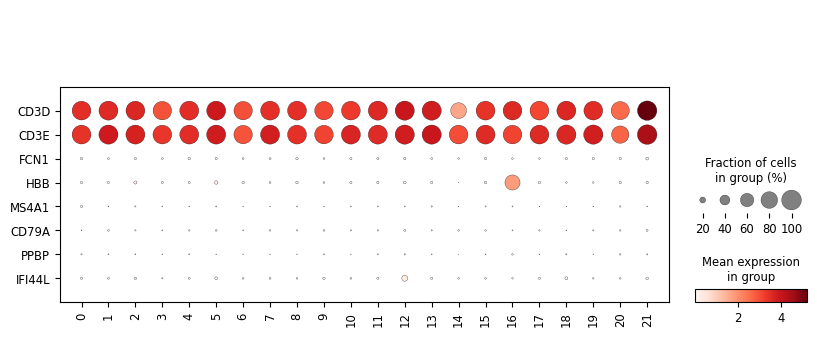

In [70]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

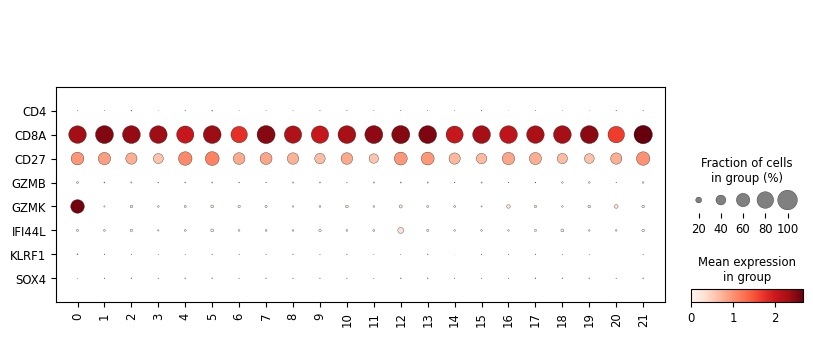

In [71]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

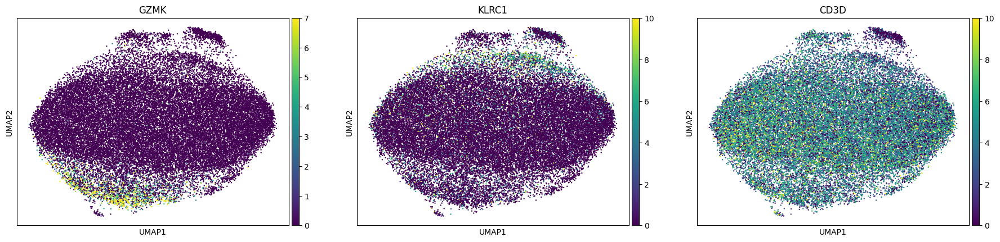

In [72]:
sc.pl.umap(adata, color = ['GZMK','KLRC1','CD3D'], vmax = 'p99', size = 12)

### Cluster counts

In [73]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     3193
1     2847
2     2845
3     2836
4     2834
5     2684
6     2246
7     1868
8     1790
9     1668
10    1549
11    1513
12    1401
13    1337
14     938
15     873
16     814
17     730
18     585
19     354
20     196
21     116
Name: count, dtype: int64

### Investigate outliers

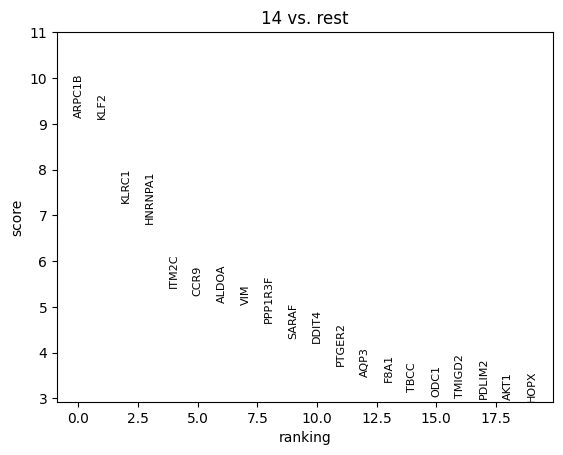

In [74]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['14']
)
sc.pl.rank_genes_groups(adata)

### Comparison to original labels

In [75]:
adata = add_labels(adata, original_df)

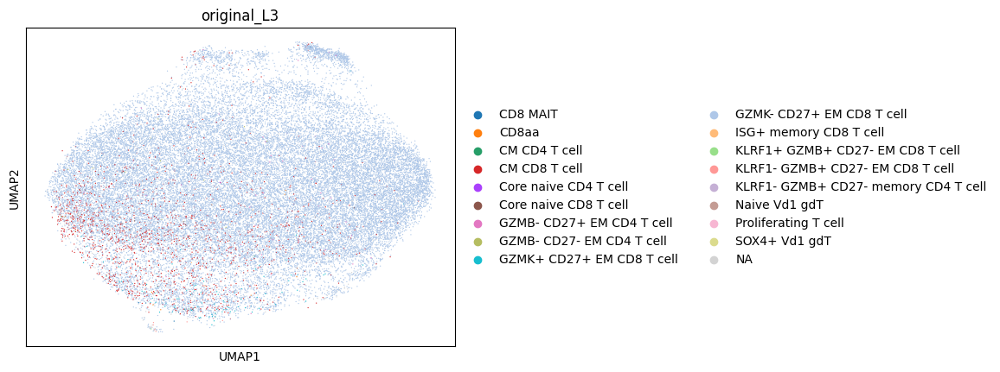

In [76]:
sc.pl.umap(adata, color = 'original_L3')

In [77]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK- CD27+ EM CD8 T cell               33139
CM CD8 T cell                            1417
NaN                                       404
GZMK+ CD27+ EM CD8 T cell                 104
GZMB- CD27+ EM CD4 T cell                  58
Core naive CD8 T cell                      33
GZMB- CD27- EM CD4 T cell                  14
CD8 MAIT                                   14
KLRF1- GZMB+ CD27- EM CD8 T cell           13
CD8aa                                       8
CM CD4 T cell                               3
ISG+ memory CD8 T cell                      3
KLRF1+ GZMB+ CD27- EM CD8 T cell            2
Core naive CD4 T cell                       1
KLRF1- GZMB+ CD27- memory CD4 T cell        1
Naive Vd1 gdT                               1
Proliferating T cell                        1
SOX4+ Vd1 gdT                               1
Name: count, dtype: int64

In [78]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK- CD27+ EM CD8 T cell               0.940994
CM CD8 T cell                           0.040236
NaN                                     0.011472
GZMK+ CD27+ EM CD8 T cell               0.002953
GZMB- CD27+ EM CD4 T cell               0.001647
Core naive CD8 T cell                   0.000937
GZMB- CD27- EM CD4 T cell               0.000398
CD8 MAIT                                0.000398
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000369
CD8aa                                   0.000227
CM CD4 T cell                           0.000085
ISG+ memory CD8 T cell                  0.000085
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000057
Core naive CD4 T cell                   0.000028
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000028
Naive Vd1 gdT                           0.000028
Proliferating T cell                    0.000028
SOX4+ Vd1 gdT                           0.000028
Name: count, dtype: float64

### Proposed updates

- Reassign GZMK+ cluster as GZMK+ CD27+ EM CD8 T cell

## Review GZMK+ CD27+ EM CD8 T cell

In [79]:
cell_type = 'GZMK+ CD27+ EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [80]:
type_uuid

'fc43bd5d-a792-4974-9a52-c5a213b9c331'

In [81]:
adata = read_adata_uuid(type_uuid)

### Clustering

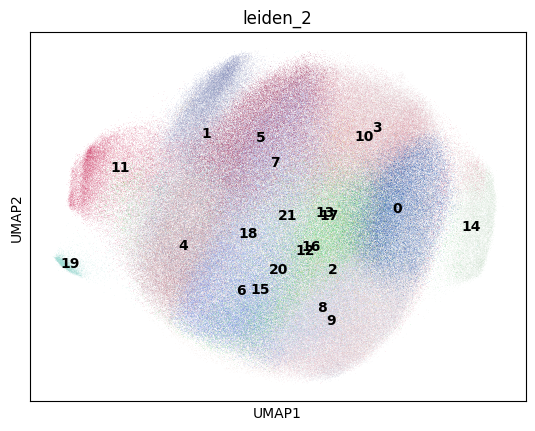

In [82]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

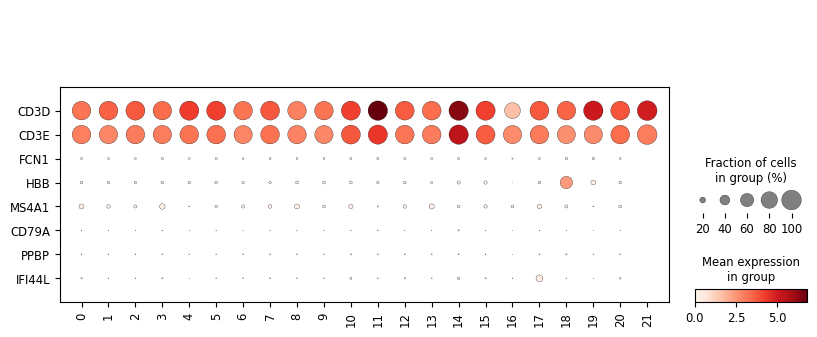

In [83]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

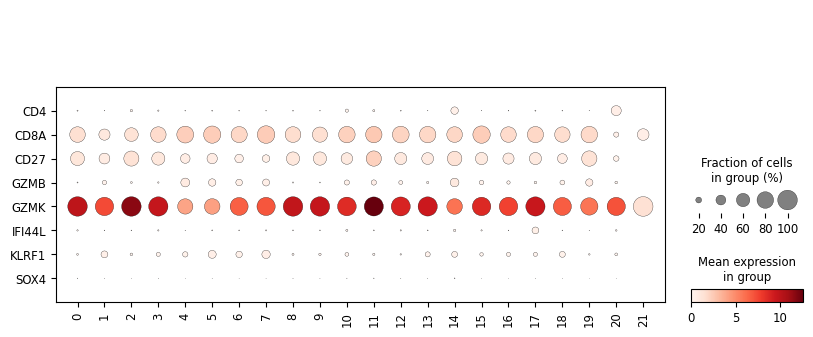

In [84]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Outlier investigation

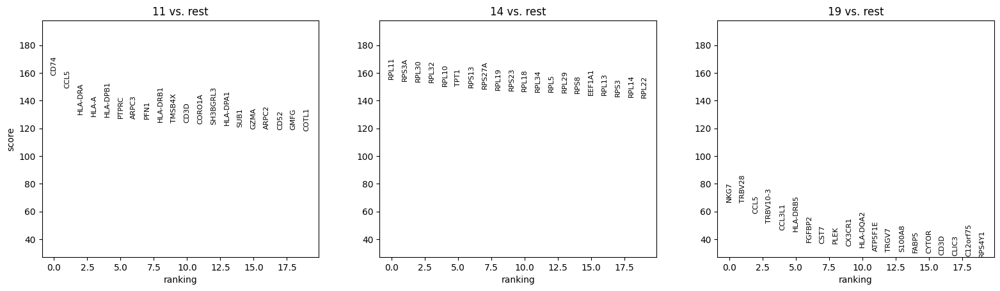

In [85]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['11','14','19']
)
sc.pl.rank_genes_groups(adata)

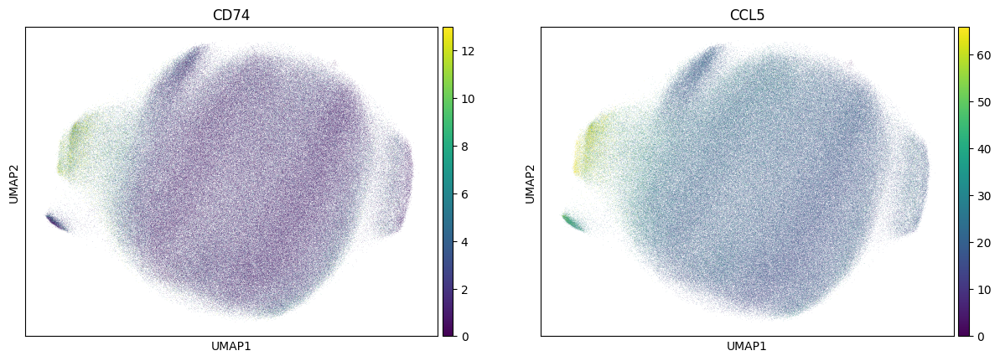

In [86]:
sc.pl.umap(adata, color = ['CD74','CCL5'], vmax = 'p99')

### Comparison to original labels

In [87]:
adata = add_labels(adata, original_df)

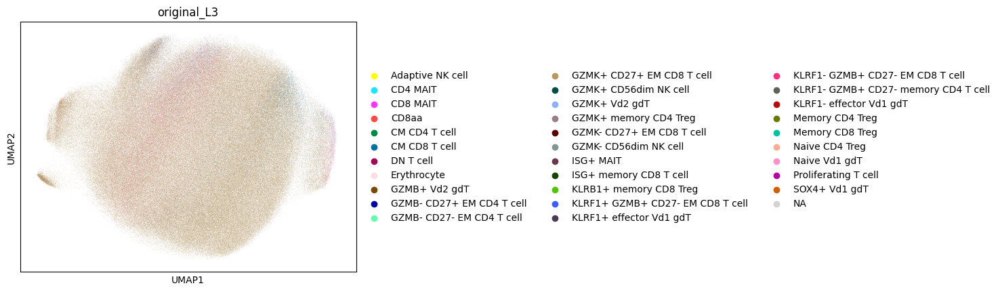

In [88]:
sc.pl.umap(adata, color = 'original_L3')

In [89]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK+ CD27+ EM CD8 T cell               484931
KLRF1- GZMB+ CD27- EM CD8 T cell         19837
NaN                                      19391
CM CD8 T cell                             8354
KLRF1+ GZMB+ CD27- EM CD8 T cell          7100
KLRF1- GZMB+ CD27- memory CD4 T cell      2940
GZMB- CD27+ EM CD4 T cell                 1645
GZMK- CD27+ EM CD8 T cell                  766
CD8 MAIT                                   737
GZMK+ Vd2 gdT                              434
CD8aa                                      271
KLRB1+ memory CD8 Treg                     229
KLRF1+ effector Vd1 gdT                    190
GZMB+ Vd2 gdT                              186
Proliferating T cell                       129
ISG+ memory CD8 T cell                      41
CD4 MAIT                                    38
KLRF1- effector Vd1 gdT                     29
Erythrocyte                                 26
GZMB- CD27- EM CD4 T cell                   21
ISG+ MAIT                                   17
C

In [90]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK+ CD27+ EM CD8 T cell               0.885898
KLRF1- GZMB+ CD27- EM CD8 T cell        0.036239
NaN                                     0.035425
CM CD8 T cell                           0.015262
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.012971
KLRF1- GZMB+ CD27- memory CD4 T cell    0.005371
GZMB- CD27+ EM CD4 T cell               0.003005
GZMK- CD27+ EM CD8 T cell               0.001399
CD8 MAIT                                0.001346
GZMK+ Vd2 gdT                           0.000793
CD8aa                                   0.000495
KLRB1+ memory CD8 Treg                  0.000418
KLRF1+ effector Vd1 gdT                 0.000347
GZMB+ Vd2 gdT                           0.000340
Proliferating T cell                    0.000236
ISG+ memory CD8 T cell                  0.000075
CD4 MAIT                                0.000069
KLRF1- effector Vd1 gdT                 0.000053
Erythrocyte                             0.000047
GZMB- CD27- EM CD4 T cell               0.000038
ISG+ MAI

### Proposed updates

- Reassign high CCL5 cluster as new Memory CD4 CTL?

## Review ISG+ memory CD8 T cell

In [91]:
cell_type = 'ISG+ memory CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [92]:
type_uuid

'7a357af1-4791-4673-a0d6-a10a8a15cd6d'

In [93]:
adata = read_adata_uuid(type_uuid)

### Clustering

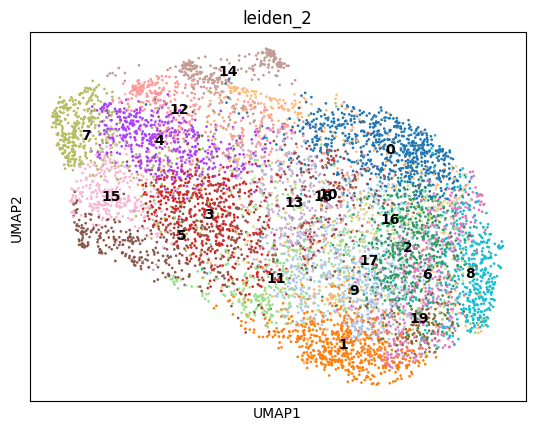

In [94]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

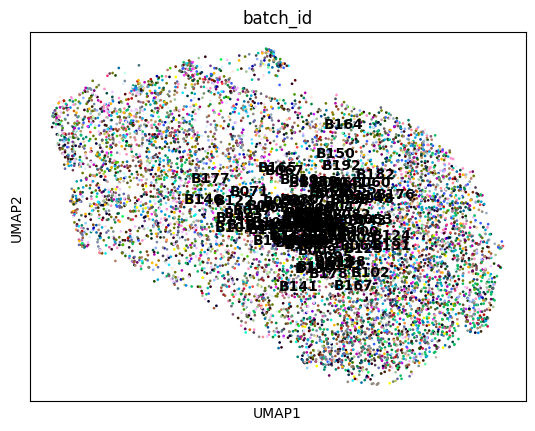

In [95]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

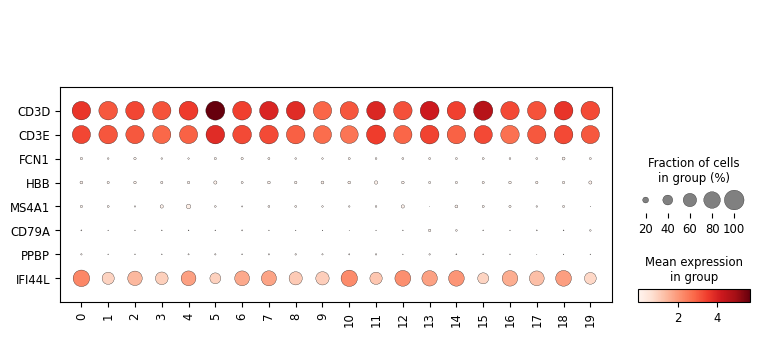

In [96]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

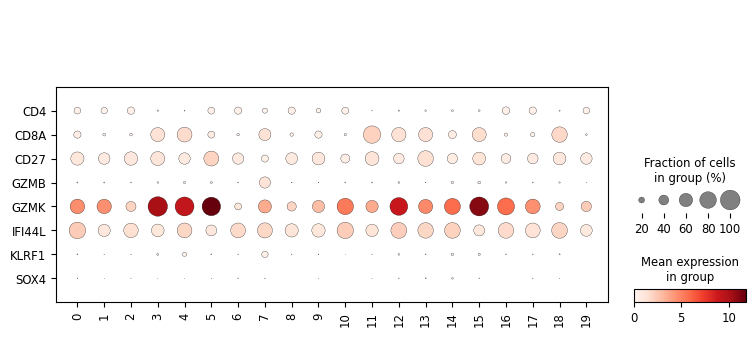

In [97]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

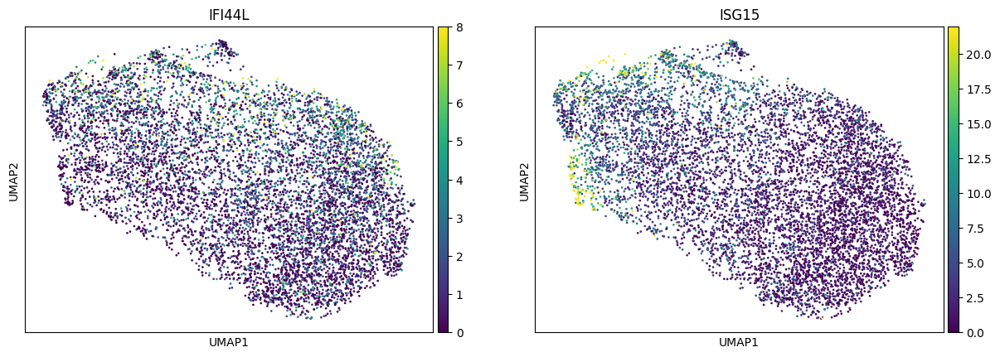

In [98]:
sc.pl.umap(adata, color = ['IFI44L','ISG15'], vmax = 'p99')

### Comparison to original labels

In [99]:
adata = add_labels(adata, original_df)

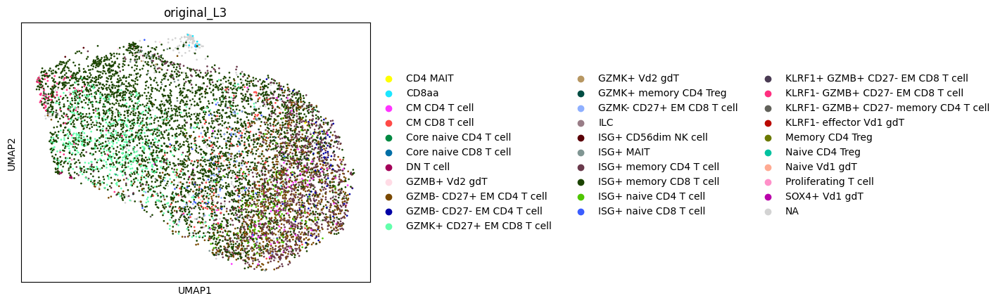

In [100]:
sc.pl.umap(adata, color = 'original_L3')

In [101]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ISG+ memory CD8 T cell                  4057
ISG+ memory CD4 T cell                  1199
GZMB- CD27+ EM CD4 T cell                948
GZMK+ CD27+ EM CD8 T cell                571
NaN                                      434
ISG+ naive CD4 T cell                    147
CM CD8 T cell                            131
CM CD4 T cell                             89
GZMB- CD27- EM CD4 T cell                 77
KLRF1- GZMB+ CD27- EM CD8 T cell          72
GZMK- CD27+ EM CD8 T cell                 68
ISG+ MAIT                                 61
ISG+ naive CD8 T cell                     33
GZMB+ Vd2 gdT                             21
KLRF1- GZMB+ CD27- memory CD4 T cell      17
DN T cell                                  8
CD8aa                                      8
Memory CD4 Treg                            4
Naive Vd1 gdT                              3
ISG+ CD56dim NK cell                       3
GZMK+ Vd2 gdT                              3
Core naive CD8 T cell                      

In [102]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ISG+ memory CD8 T cell                  0.509162
ISG+ memory CD4 T cell                  0.150477
GZMB- CD27+ EM CD4 T cell               0.118976
GZMK+ CD27+ EM CD8 T cell               0.071662
NaN                                     0.054468
ISG+ naive CD4 T cell                   0.018449
CM CD8 T cell                           0.016441
CM CD4 T cell                           0.011170
GZMB- CD27- EM CD4 T cell               0.009664
KLRF1- GZMB+ CD27- EM CD8 T cell        0.009036
GZMK- CD27+ EM CD8 T cell               0.008534
ISG+ MAIT                               0.007656
ISG+ naive CD8 T cell                   0.004142
GZMB+ Vd2 gdT                           0.002636
KLRF1- GZMB+ CD27- memory CD4 T cell    0.002134
DN T cell                               0.001004
CD8aa                                   0.001004
Memory CD4 Treg                         0.000502
Naive Vd1 gdT                           0.000377
ISG+ CD56dim NK cell                    0.000377
GZMK+ Vd

### Proposed updates

No proposed changes

## Review ISG+ naive CD8 T cell

In [103]:
cell_type = 'ISG+ naive CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [104]:
type_uuid

'2dc30580-80d3-4133-ac53-aa65b55e4b95'

In [105]:
adata = read_adata_uuid(type_uuid)

### Clustering

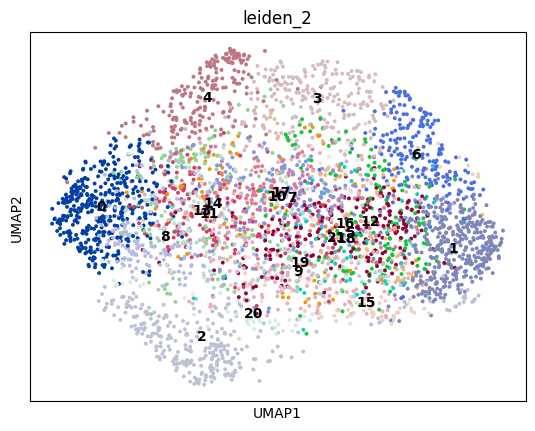

In [106]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

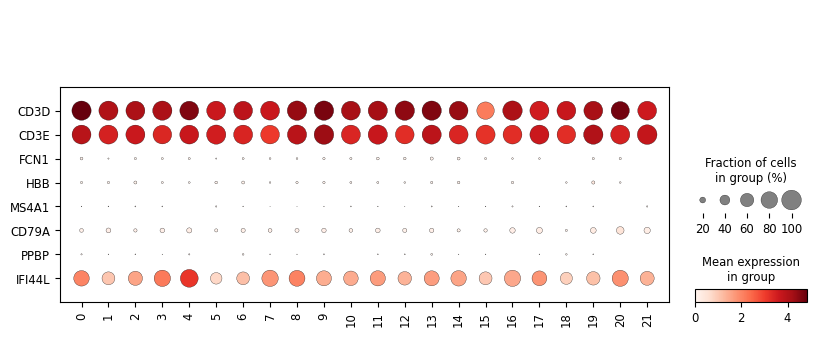

In [107]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

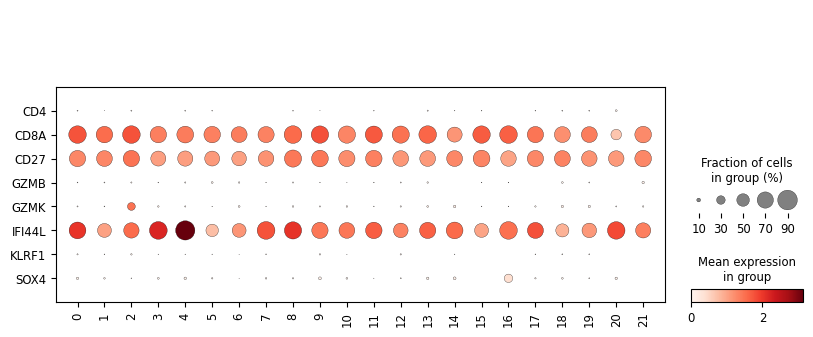

In [108]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

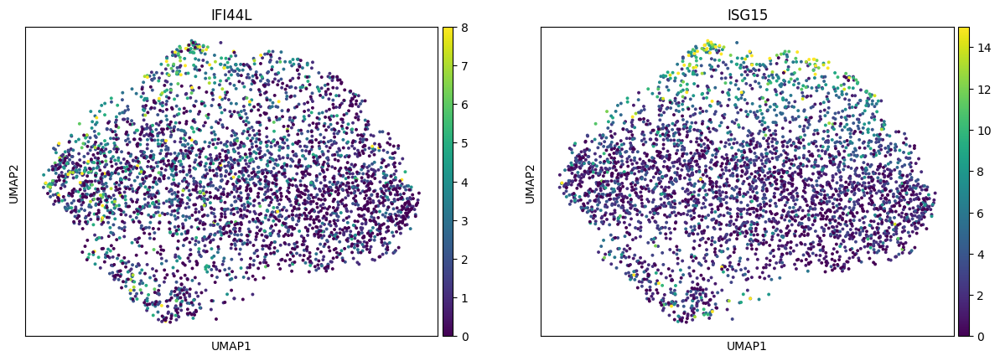

In [109]:
sc.pl.umap(adata, color = ['IFI44L','ISG15'], vmax = 'p99')

### Comparison to original labels

In [110]:
adata = add_labels(adata, original_df)

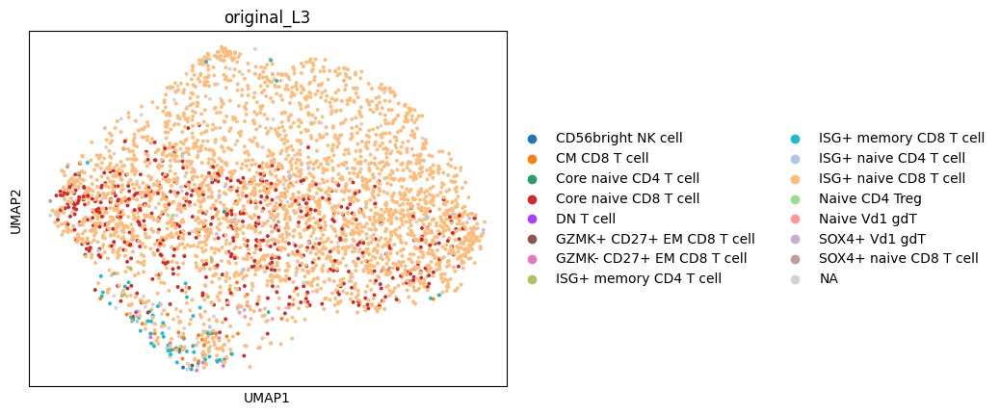

In [111]:
sc.pl.umap(adata, color = 'original_L3')

In [112]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ISG+ naive CD8 T cell        2924
Core naive CD8 T cell         480
NaN                           207
ISG+ memory CD8 T cell         59
CM CD8 T cell                  26
ISG+ naive CD4 T cell          20
SOX4+ naive CD8 T cell         12
ISG+ memory CD4 T cell          8
GZMK- CD27+ EM CD8 T cell       7
Naive Vd1 gdT                   6
GZMK+ CD27+ EM CD8 T cell       2
SOX4+ Vd1 gdT                   2
CD56bright NK cell              1
Core naive CD4 T cell           1
DN T cell                       1
Naive CD4 Treg                  1
Name: count, dtype: int64

In [113]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ISG+ naive CD8 T cell        0.778281
Core naive CD8 T cell        0.127762
NaN                          0.055097
ISG+ memory CD8 T cell       0.015704
CM CD8 T cell                0.006920
ISG+ naive CD4 T cell        0.005323
SOX4+ naive CD8 T cell       0.003194
ISG+ memory CD4 T cell       0.002129
GZMK- CD27+ EM CD8 T cell    0.001863
Naive Vd1 gdT                0.001597
GZMK+ CD27+ EM CD8 T cell    0.000532
SOX4+ Vd1 gdT                0.000532
CD56bright NK cell           0.000266
Core naive CD4 T cell        0.000266
DN T cell                    0.000266
Naive CD4 Treg               0.000266
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review KLRF1- GZMB+ CD27- EM CD8 T cell

In [114]:
cell_type = 'KLRF1- GZMB+ CD27- EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [115]:
type_uuid

'b5bf5444-4f61-4775-99d3-f0b708ba3952'

In [116]:
adata = read_adata_uuid(type_uuid)

### Clustering

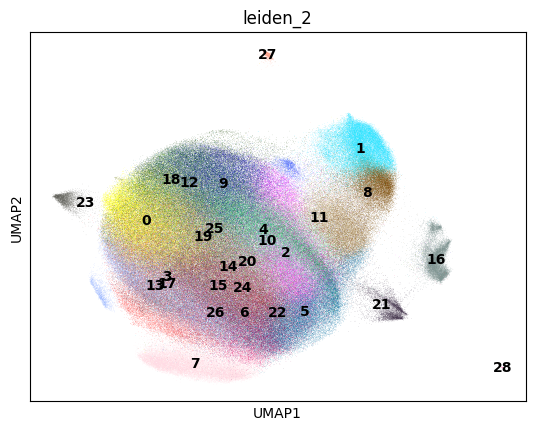

In [117]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

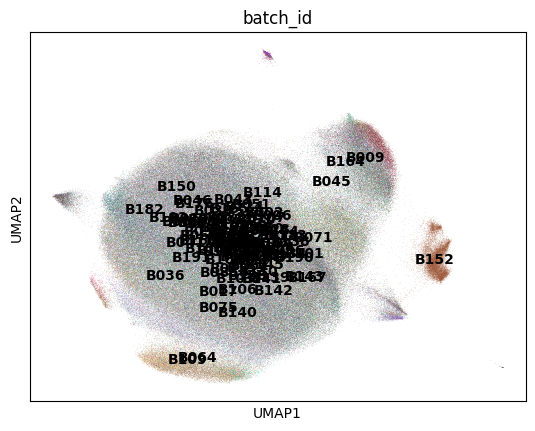

In [118]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

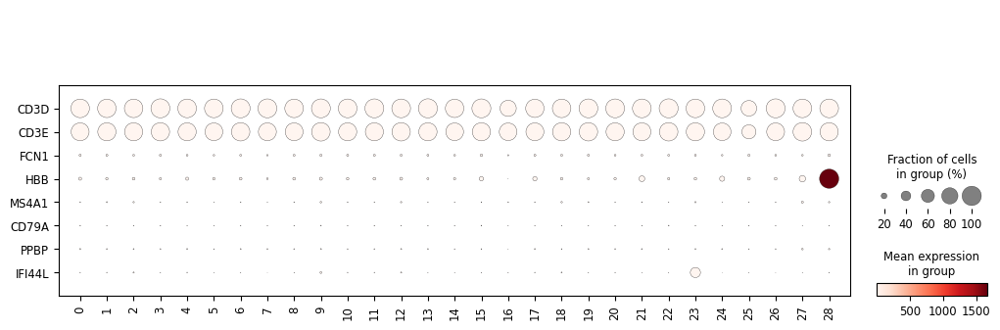

In [119]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

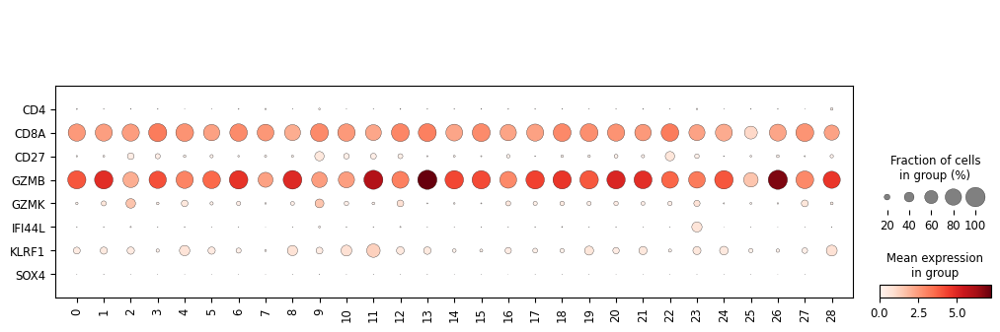

In [120]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Outlier investigation

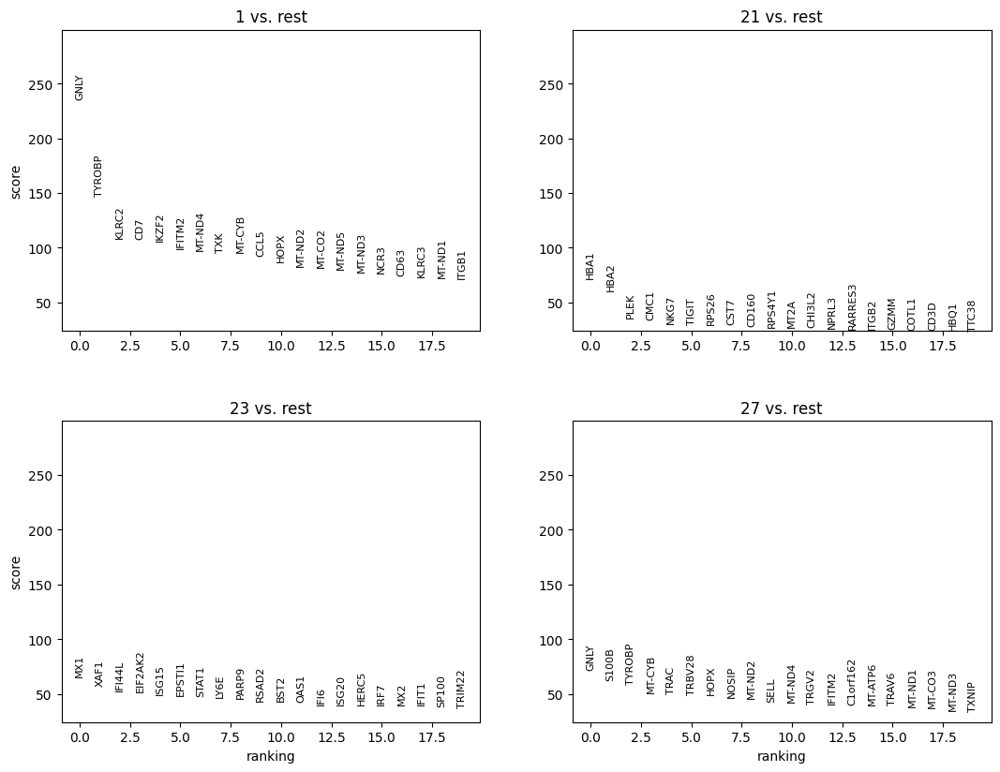

In [121]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1','21','23','27']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

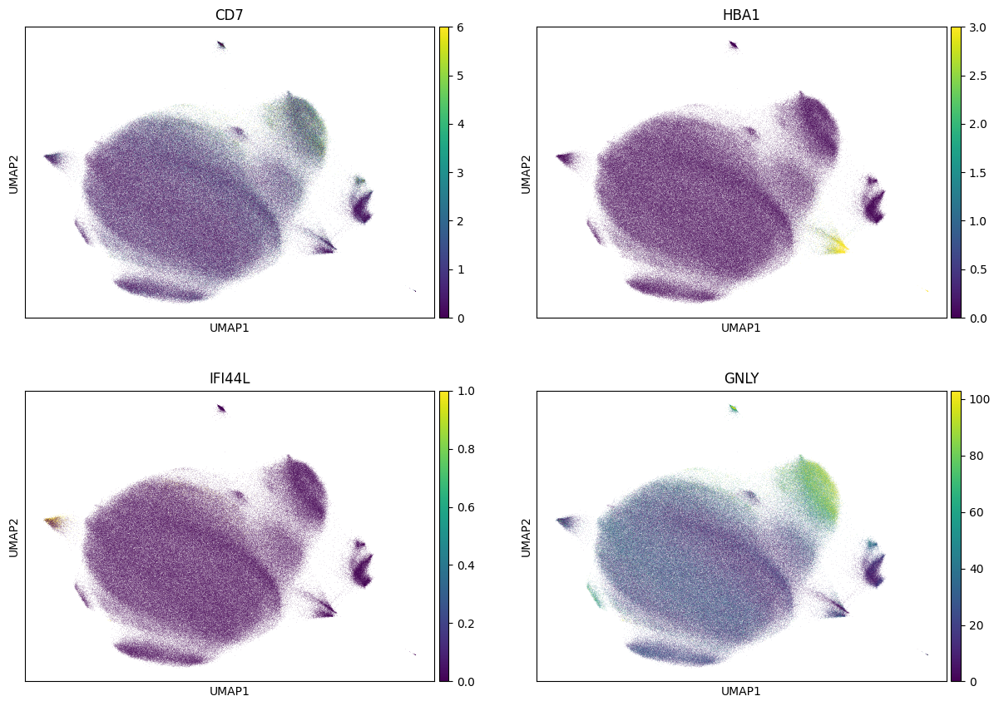

In [122]:
sc.pl.umap(adata, color = ['CD7','HBA1','IFI44L','GNLY'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [123]:
adata = add_labels(adata, original_df)

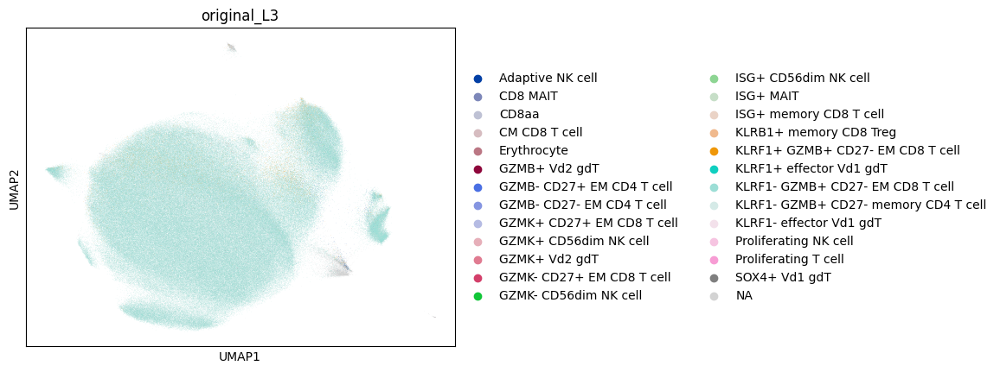

In [124]:
sc.pl.umap(adata, color = 'original_L3')

In [125]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
KLRF1- GZMB+ CD27- EM CD8 T cell        456495
NaN                                      23540
KLRF1+ GZMB+ CD27- EM CD8 T cell          6520
KLRF1- GZMB+ CD27- memory CD4 T cell      5160
GZMK+ CD27+ EM CD8 T cell                 1667
KLRF1- effector Vd1 gdT                   1388
Adaptive NK cell                          1179
KLRF1+ effector Vd1 gdT                    564
GZMB+ Vd2 gdT                              341
Proliferating T cell                        77
CD8aa                                       63
CM CD8 T cell                               36
KLRB1+ memory CD8 Treg                      24
GZMK- CD56dim NK cell                       22
GZMK- CD27+ EM CD8 T cell                   19
ISG+ memory CD8 T cell                      11
Erythrocyte                                 11
CD8 MAIT                                     6
GZMB- CD27+ EM CD4 T cell                    5
ISG+ MAIT                                    4
GZMK+ CD56dim NK cell                        3
I

In [126]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
KLRF1- GZMB+ CD27- EM CD8 T cell        0.918240
NaN                                     0.047351
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.013115
KLRF1- GZMB+ CD27- memory CD4 T cell    0.010379
GZMK+ CD27+ EM CD8 T cell               0.003353
KLRF1- effector Vd1 gdT                 0.002792
Adaptive NK cell                        0.002372
KLRF1+ effector Vd1 gdT                 0.001134
GZMB+ Vd2 gdT                           0.000686
Proliferating T cell                    0.000155
CD8aa                                   0.000127
CM CD8 T cell                           0.000072
KLRB1+ memory CD8 Treg                  0.000048
GZMK- CD56dim NK cell                   0.000044
GZMK- CD27+ EM CD8 T cell               0.000038
ISG+ memory CD8 T cell                  0.000022
Erythrocyte                             0.000022
CD8 MAIT                                0.000012
GZMB- CD27+ EM CD4 T cell               0.000010
ISG+ MAIT                               0.000008
GZMK+ CD

### Proposed updates

- Reassign IFI44L-high cluster as ISG+ memory CD8 T cell
- Remove HBA1-high cluster as Erythrocyte doublet

## Review KLRF1+ GZMB+ CD27- EM CD8 T cell

In [127]:
cell_type = 'KLRF1+ GZMB+ CD27- EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [128]:
type_uuid

'1d057e47-1da6-4e03-b39c-c67e3646342e'

In [129]:
adata = read_adata_uuid(type_uuid)

### Clustering

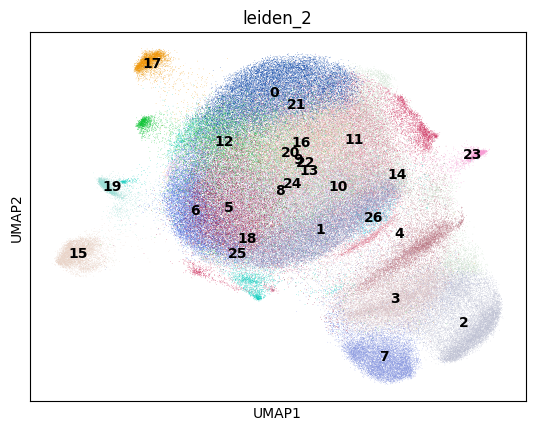

In [130]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

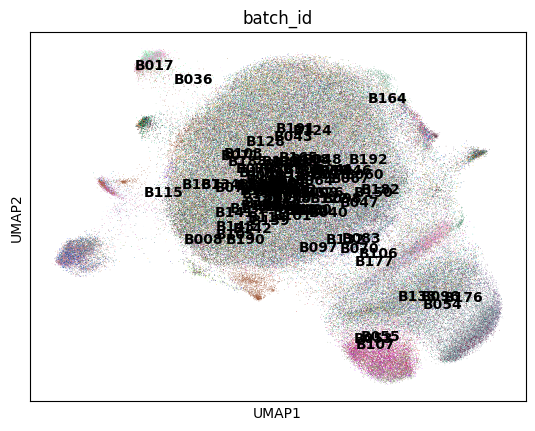

In [131]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

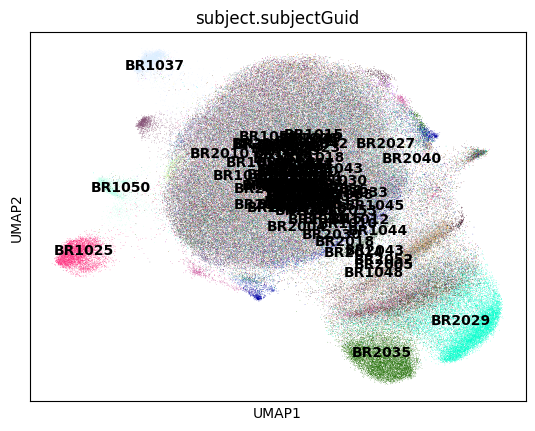

In [132]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

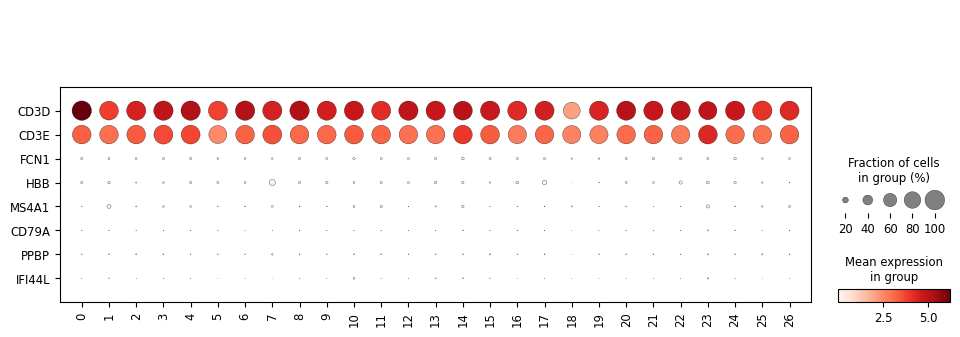

In [133]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

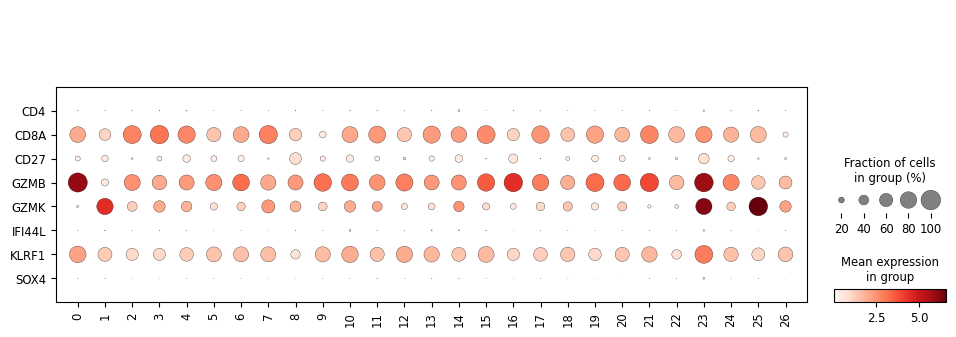

In [134]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

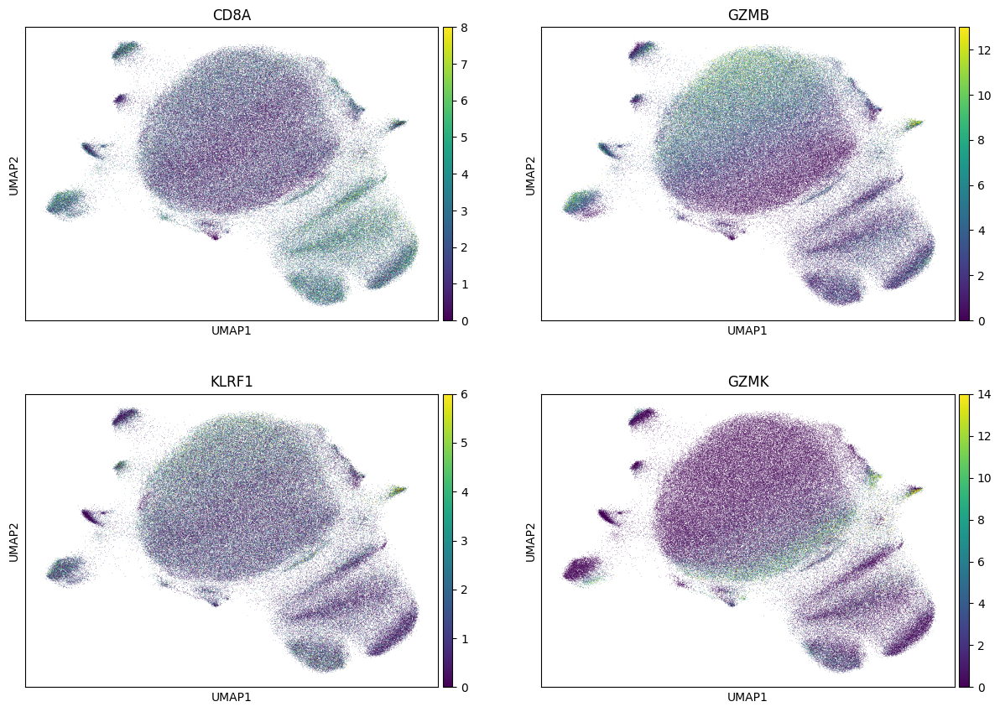

In [135]:
sc.pl.umap(adata, color = ['CD8A','GZMB','KLRF1','GZMK'], vmax = 'p99', ncols = 2)

### Outlier investigation

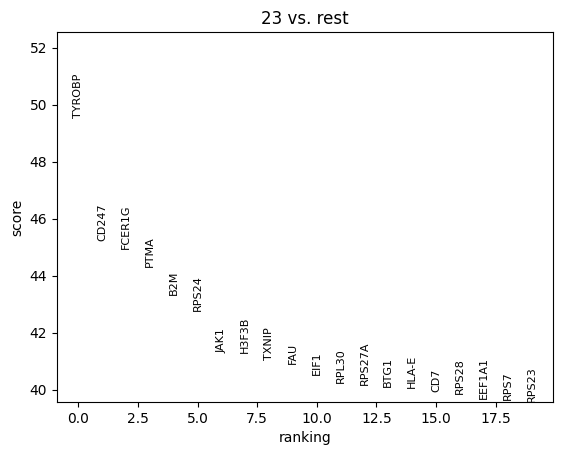

In [136]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['23']
)
sc.pl.rank_genes_groups(adata)

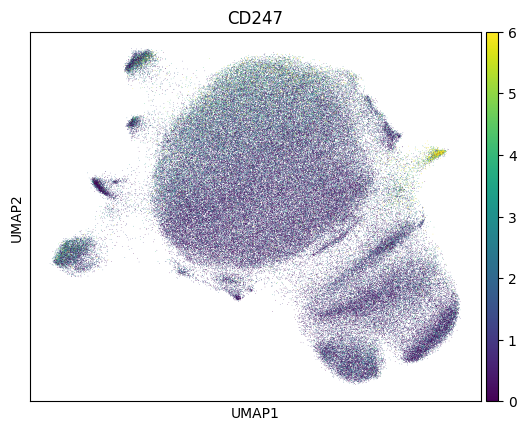

In [137]:
sc.pl.umap(adata, color = ['CD247'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [138]:
adata = add_labels(adata, original_df)

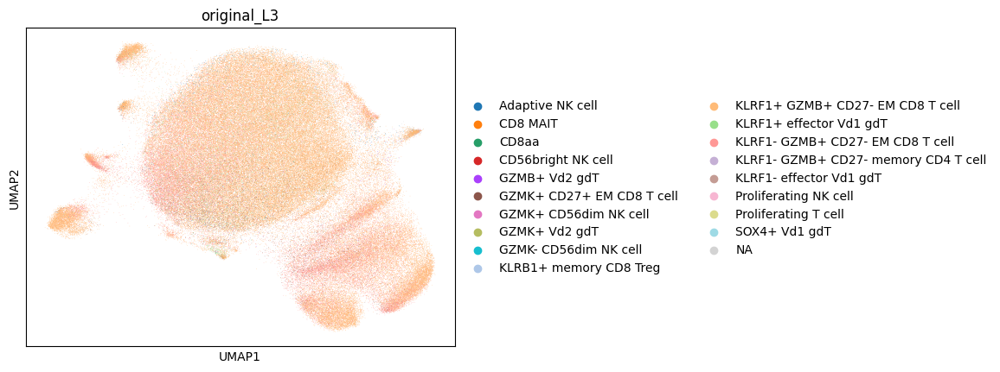

In [139]:
sc.pl.umap(adata, color = 'original_L3')

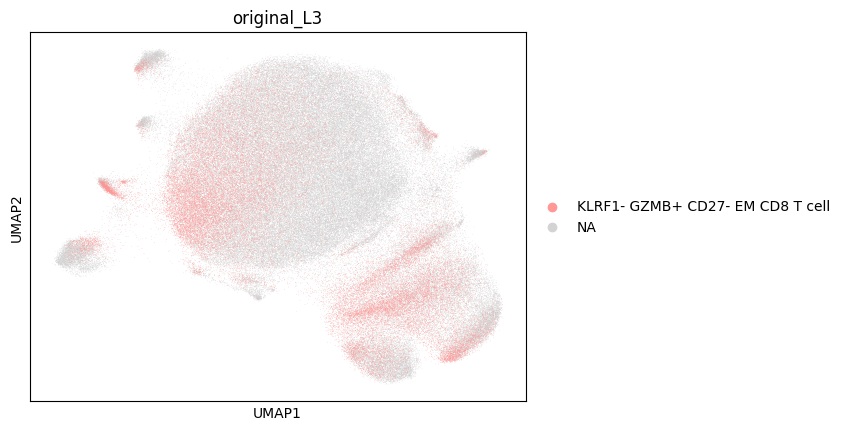

In [140]:
sc.pl.umap(adata, color = 'original_L3', groups = 'KLRF1- GZMB+ CD27- EM CD8 T cell')

In [141]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
KLRF1+ GZMB+ CD27- EM CD8 T cell        130372
KLRF1- GZMB+ CD27- EM CD8 T cell         36526
KLRF1+ effector Vd1 gdT                   5160
GZMK+ CD27+ EM CD8 T cell                 3908
NaN                                       2224
Adaptive NK cell                          1009
KLRF1- effector Vd1 gdT                    400
GZMB+ Vd2 gdT                              287
KLRF1- GZMB+ CD27- memory CD4 T cell        64
GZMK+ CD56dim NK cell                       62
CD8aa                                       59
GZMK+ Vd2 gdT                               19
Proliferating T cell                        16
GZMK- CD56dim NK cell                        6
KLRB1+ memory CD8 Treg                       4
CD56bright NK cell                           3
Proliferating NK cell                        2
CD8 MAIT                                     1
SOX4+ Vd1 gdT                                1
Name: count, dtype: int64

In [142]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.723794
KLRF1- GZMB+ CD27- EM CD8 T cell        0.202784
KLRF1+ effector Vd1 gdT                 0.028647
GZMK+ CD27+ EM CD8 T cell               0.021696
NaN                                     0.012347
Adaptive NK cell                        0.005602
KLRF1- effector Vd1 gdT                 0.002221
GZMB+ Vd2 gdT                           0.001593
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000355
GZMK+ CD56dim NK cell                   0.000344
CD8aa                                   0.000328
GZMK+ Vd2 gdT                           0.000105
Proliferating T cell                    0.000089
GZMK- CD56dim NK cell                   0.000033
KLRB1+ memory CD8 Treg                  0.000022
CD56bright NK cell                      0.000017
Proliferating NK cell                   0.000011
CD8 MAIT                                0.000006
SOX4+ Vd1 gdT                           0.000006
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review SOX4+ naive CD8 T cell

In [143]:
cell_type = 'SOX4+ naive CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [144]:
type_uuid

'54fe95b9-48ee-4d4e-a189-210b3482f13b'

In [145]:
adata = read_adata_uuid(type_uuid)

### Clustering

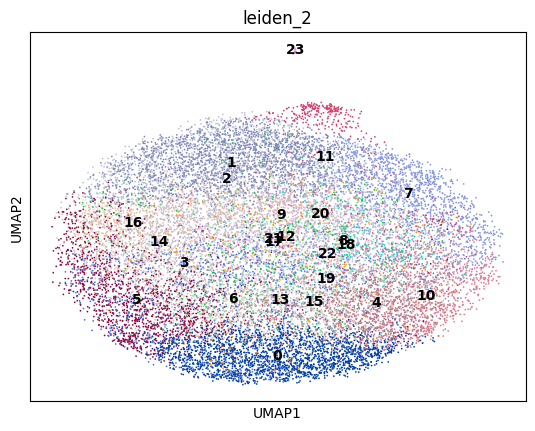

In [146]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

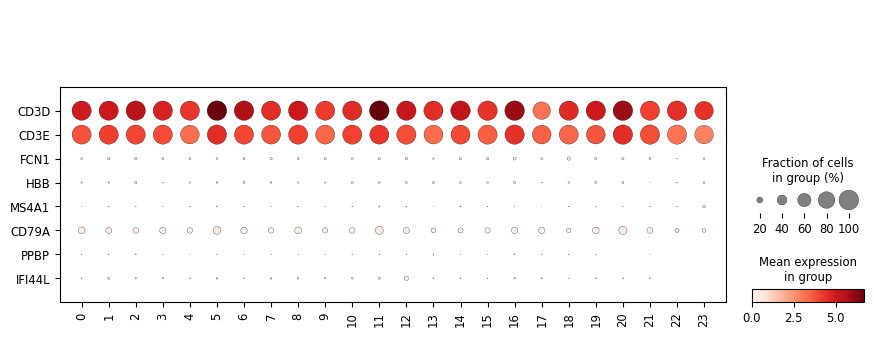

In [147]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

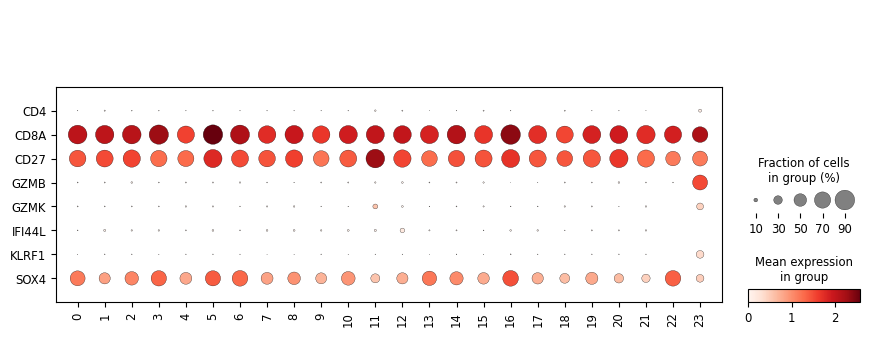

In [148]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

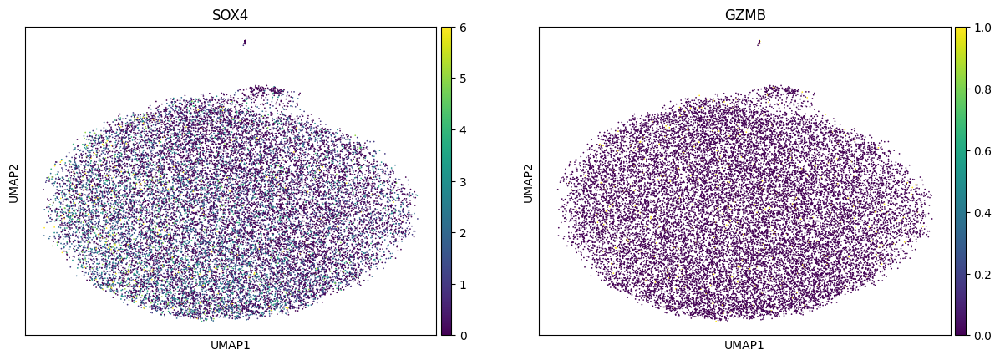

In [149]:
sc.pl.umap(adata, color = ['SOX4','GZMB'], vmax = 'p99')

### Cluster counts

In [150]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     2079
1     1968
2     1851
3     1481
4     1437
5     1437
6     1428
7     1396
8     1259
9      724
10     712
11     562
13     465
12     465
14     361
15     314
16     311
17     305
18     266
19     251
20     244
21     187
22      74
23      27
Name: count, dtype: int64

### Comparison to original labels

In [151]:
adata = add_labels(adata, original_df)

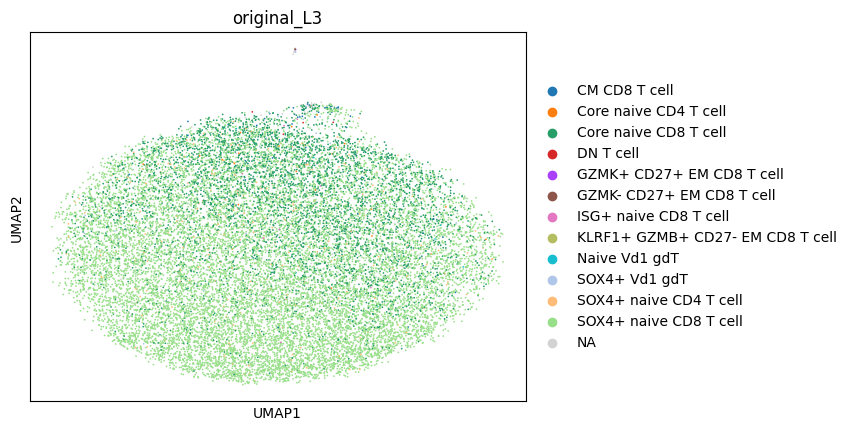

In [152]:
sc.pl.umap(adata, color = 'original_L3')

In [153]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
SOX4+ naive CD8 T cell              14829
Core naive CD8 T cell                4105
SOX4+ naive CD4 T cell                274
NaN                                   243
CM CD8 T cell                          57
SOX4+ Vd1 gdT                          37
Core naive CD4 T cell                  32
Naive Vd1 gdT                          10
ISG+ naive CD8 T cell                   9
DN T cell                               5
GZMK+ CD27+ EM CD8 T cell               1
GZMK- CD27+ EM CD8 T cell               1
KLRF1+ GZMB+ CD27- EM CD8 T cell        1
Name: count, dtype: int64

In [154]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
SOX4+ naive CD8 T cell              0.756427
Core naive CD8 T cell               0.209396
SOX4+ naive CD4 T cell              0.013977
NaN                                 0.012395
CM CD8 T cell                       0.002908
SOX4+ Vd1 gdT                       0.001887
Core naive CD4 T cell               0.001632
Naive Vd1 gdT                       0.000510
ISG+ naive CD8 T cell               0.000459
DN T cell                           0.000255
GZMK+ CD27+ EM CD8 T cell           0.000051
GZMK- CD27+ EM CD8 T cell           0.000051
KLRF1+ GZMB+ CD27- EM CD8 T cell    0.000051
Name: count, dtype: float64

### Proposed updates

Remove high GZMB cluster as mislabeled